## Visualization

### Plotting waveplots

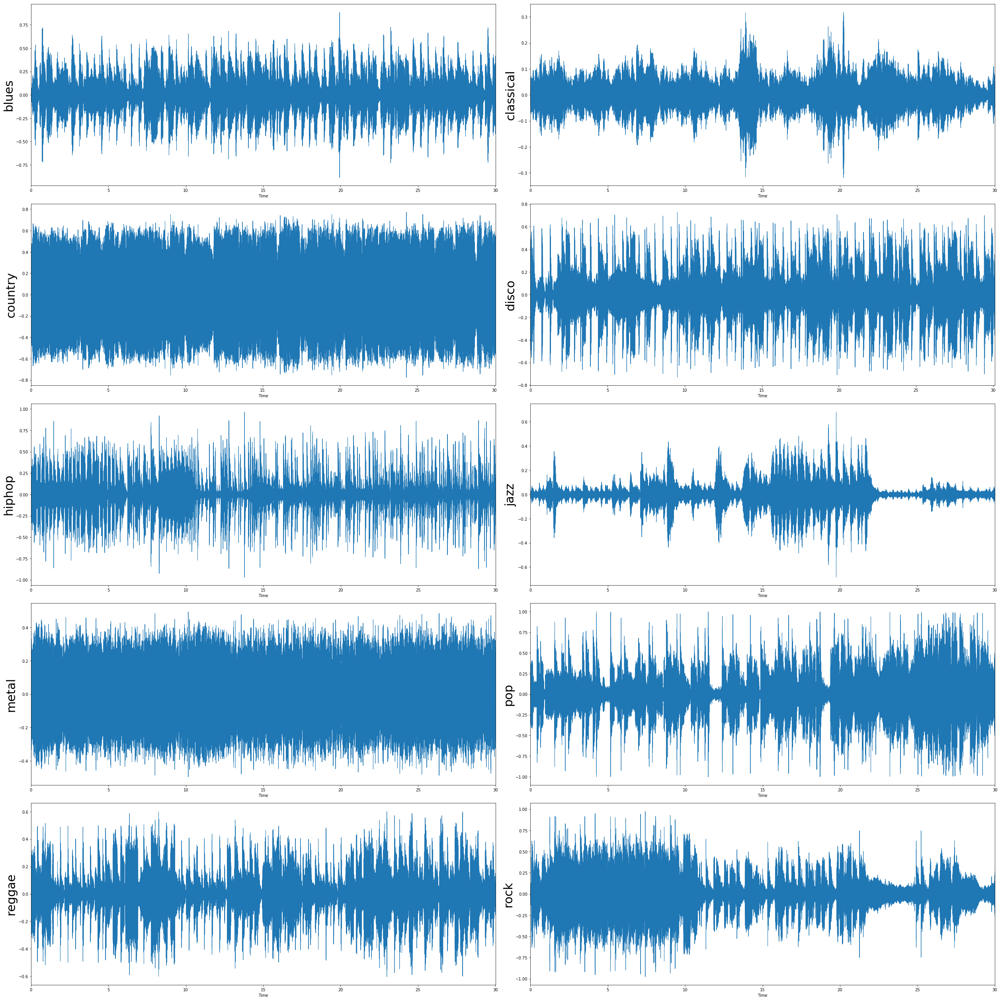

In [11]:
import os
import librosa
import librosa.display
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline


genres = ['blues','classical','country','disco','hiphop','jazz','metal','pop','reggae','rock']

#Plotting with the old style 
fig = plt.figure(figsize=(35,35))
plt.clf()
i = 0
for filename in os.listdir(f'./demo'):
    plt.subplot(5,2, i+1)
    x , sr = librosa.load(f'./demo/'+ filename )
    librosa.display.waveplot(x, sr=sr)
    plt.ylabel(genres[i], fontsize=30)
    i+=1
fig.tight_layout()

### Specshow plots:

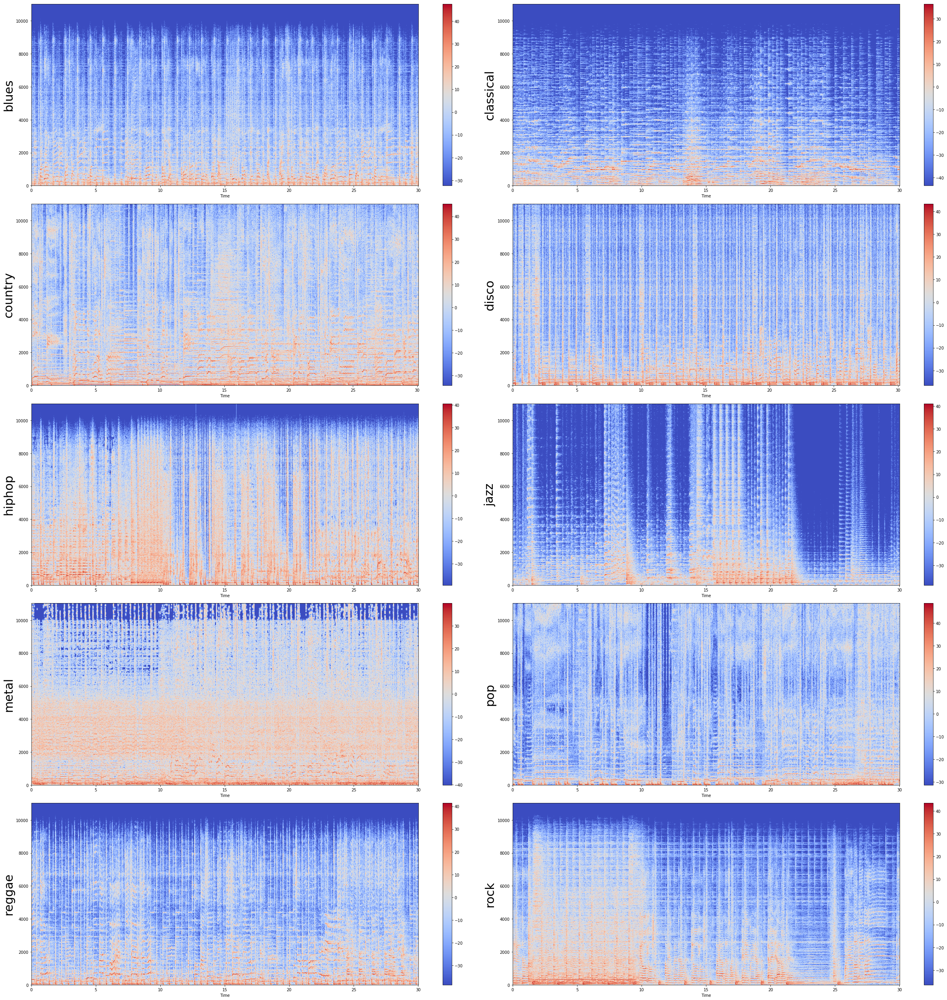

In [12]:
fig = plt.figure(figsize=(35,35))
plt.clf()
i = 0
for filename in os.listdir(f'./demo'):
    plt.subplot(5,2, i+1)
    x , sr = librosa.load(f'./demo/'+ filename )
    X = librosa.stft(x)
    Xdb = librosa.amplitude_to_db(abs(X))
    librosa.display.specshow(Xdb, sr=sr, x_axis='time', y_axis='hz')
    plt.colorbar()
    plt.ylabel(genres[i], fontsize=30)
    i+=1
fig.tight_layout()


### Zero Crossing Rate:

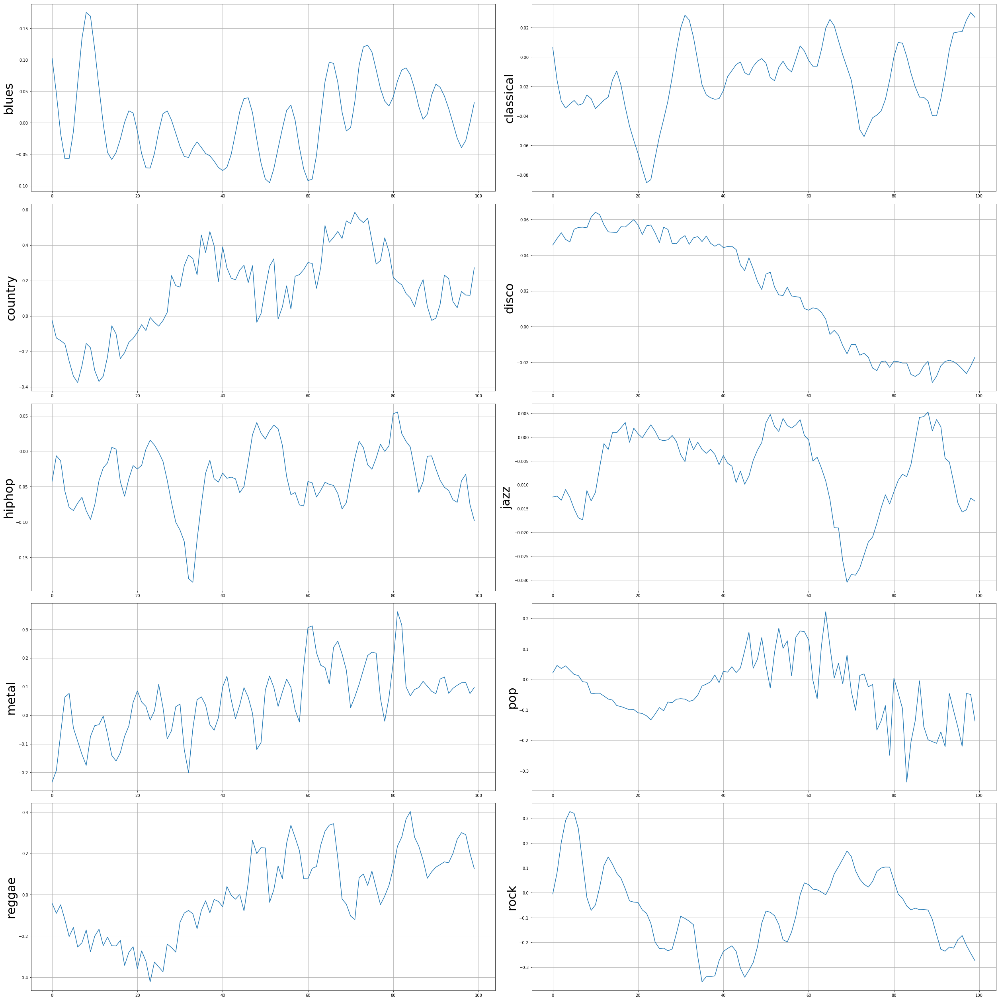

In [16]:
n0 = 9000
n1 = 9100
z_crossings = []
fig = plt.figure(figsize=(35,35))
plt.clf()
i = 0
for filename in os.listdir(f'./demo'):
    plt.subplot(5,2, i+1)
    x , sr = librosa.load(f'./demo/'+ filename )
    plt.plot(x[n0:n1])
    plt.grid()
    plt.ylabel(genres[i], fontsize=30)
    zero_crossings = librosa.zero_crossings(x[n0:n1], pad=False)
    z_crossings.append(sum(zero_crossings))
    i+=1
fig.tight_layout()


In [18]:
for i in range(len(genres)):
    print(genres[i] + ": " + str(z_crossings[i]))

blues: 16
classical: 10
country: 7
disco: 1
hiphop: 12
jazz: 12
metal: 19
pop: 15
reggae: 11
rock: 8


### Creating melspectograms for all the audio files:

In [ ]:
cmap = plt.get_cmap('inferno')

plt.figure(figsize=(10,10))
genres = 'blues classical country disco hiphop jazz metal pop reggae rock'.split()
for g in genres:
    pathlib.Path(f'img_data/{g}').mkdir(parents=True, exist_ok=True)     
    for filename in os.listdir(f'./genres/{g}'):
        songname = f'./genres/{g}/{filename}'
        y, sr = librosa.load(songname, mono=True, duration=5)
        plt.specgram(y, NFFT=2048, Fs=2, Fc=0, noverlap=128, cmap=cmap, sides='default', mode='default', scale='dB');
        plt.axis('off');
        plt.savefig(f'img_data/{g}/{filename[:-3].replace(".", "")}.png')
        plt.clf()

In [19]:
import IPython.display as ipd

ipd.Audio(f'./demo/blues.00000.wav')

# Models:

## KNN Model

In [3]:
import load_data
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from sklearn.neighbors import KNeighborsClassifier
import numpy as np
import random
import math


PCA_flag = False

dataset = load_data.loadall('melspectograms.npz')
x_train = dataset['x_train']
y_train = dataset['y_train']
x_test = dataset['x_test']
y_test = dataset['y_test']
x_cv = dataset['x_cv']
y_cv = dataset['y_cv']

x_train = x_train.reshape(x_train.shape[0], x_train.shape[1]*x_train.shape[2])
x_test = x_test.reshape(x_test.shape[0], x_test.shape[1]*x_test.shape[2])
x_cv = x_cv.reshape(x_cv.shape[0], x_cv.shape[1]*x_cv.shape[2])

#standardizing the features
scaler = StandardScaler()
scaler.fit(x_train)


scaled_train = scaler.transform(x_train)
scaled_test = scaler.transform(x_test)
scaled_cv = scaler.transform(x_cv)


if PCA_flag == True:
    pca = PCA(n_components = 15)
    pca.fit(scaled_train)

    #dimentionality reduction
    pca_train = pca.transform(scaled_train)
    pca_cv = pca.transform(scaled_cv)
    pca_test = pca.transform(scaled_test)


    model = KNeighborsClassifier(n_neighbors=5, weights='distance')
    model.fit(pca_train, y_train)

    #predicting on training data
    train_preds = model.predict(pca_train)
    train_acc = np.sum(train_preds == y_train)
    train_acc = train_acc / len(y_train)
    
    #predicting on cv data
    cv_preds = model.predict(pca_cv)
    cv_acc = np.sum(cv_preds == y_cv)
    cv_acc = cv_acc / len(y_cv)

    #predicting on test data
    test_preds = model.predict(pca_test)
    test_acc = np.sum(test_preds == y_test)
    test_acc = test_acc / len(y_test)

    print('Training Accuracy Score: ', train_acc, "\tCV Accuracy Score: ", cv_acc, "\tTest Accuracy Score: ", test_acc)
    
#if PCA_flag is False no dimensionality reduction is done and n_neighbors are taken 5
else:
    model_2 = KNeighborsClassifier(n_neighbors=10, weights='distance')
    model_2.fit(scaled_train, y_train)

    preds = model_2.predict(scaled_cv)
    acc = np.sum(preds == y_cv)
    acc = acc / len(y_cv)
    print('Accuracy is {}'.format(acc))
    print("Predictioins: ",preds)



Accuracy is 0.41
Predictioins:  [4. 9. 0. 2. 3. 2. 6. 2. 6. 6. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 6. 2. 6. 9.
 8. 2. 4. 9. 0. 0. 9. 2. 6. 4. 3. 6. 8. 3. 2. 4. 4. 1. 4. 4. 4. 2. 4. 6.
 6. 4. 9. 2. 5. 5. 2. 9. 5. 9. 5. 5. 6. 4. 9. 6. 6. 6. 6. 8. 9. 6. 4. 5.
 3. 6. 7. 7. 9. 4. 6. 4. 8. 9. 5. 6. 2. 8. 1. 4. 8. 9. 9. 9. 2. 2. 3. 0.
 0. 9. 6. 9.]


## CNN-Model:

In [1]:
import numpy as np
import tensorflow as tf
from sklearn.metrics import precision_recall_fscore_support, confusion_matrix
import load_data
import matplotlib
matplotlib.use("Agg")
from matplotlib import pyplot as plt
import itertools
import keras
from keras import backend as K
from keras.models import Sequential, load_model
from keras.layers import Dense, Dropout, Flatten
from keras.layers import Conv2D, MaxPooling2D
from keras.layers import BatchNormalization
from keras.utils import np_utils
from keras import regularizers
from keras.engine.topology import Layer

cnn_accuracy = 0


def confusionmatrix(matrix, labels,
                          normalize=False,
                          title='Confusion Matrix',
                          cmap=plt.cm.Blues):
    if normalize:
        matrix = matrix.astype('float') / matrix.sum(axis=1)[:, np.newaxis]
        print('Confusion matrix, with normalization')
    else:
        print('Confusion matrix, without normalization')

    print(matrix)

    plt.imshow(matrix, interpolation='nearest', cmap=cmap)
    plt.title(title)
    plt.colorbar()
    tick_marks = np.arange(len(labels))
    plt.xticks(tick_marks, labels, rotation=45)
    plt.yticks(tick_marks, labels)

    form = '.1f' if normalize else 'd'
    thresh = matrix.max() / 2.
    for i, j in itertools.product(range(matrix.shape[0]), range(matrix.shape[1])):
        plt.text(j, i, format(matrix[i, j], form),
                 horizontalalignment="center",
                 color="white" if matrix[i, j] > thresh else "black")

    plt.ylabel('True Class')
    plt.xlabel('Predicted Class')
    plt.tight_layout()
    
genres = ["Blues","Classical","Country","Disco","Hip hop","Jazz","Metal","Pop","Reggae","Rock"]


def compare(y_true, y_pred):
    return K.mean(K.equal(K.argmax(y_true, axis=1), K.argmax(y_pred, axis=1)))

def cnn(genres=10, input_shape=(64,173,1)):
    model = Sequential()
    model.add(Conv2D(64, kernel_size=(4, 4),
                     activation='relu',
                     input_shape=input_shape))
    model.add(BatchNormalization())
    model.add(MaxPooling2D(pool_size=(2, 4)))
    model.add(Conv2D(64, (3, 5), activation='relu'
                    , kernel_regularizer=regularizers.l2(0.04)
                    ))
    model.add(MaxPooling2D(pool_size=(2, 2)))
    model.add(Dropout(0.2))
    model.add(Conv2D(64, (2, 2), activation='relu'
        ))
    model.add(BatchNormalization())
    model.add(MaxPooling2D(pool_size=(2, 2)))
    model.add(Dropout(0.2))
    model.add(Flatten())
    model.add(Dense(64, activation='relu', kernel_regularizer=regularizers.l2(0.04)))
    model.add(Dropout(0.5))
    model.add(Dense(32, activation='relu', kernel_regularizer=regularizers.l2(0.04)))
    model.add(Dense(genres, activation='softmax'))
    model.compile(loss=keras.losses.categorical_crossentropy,
                  optimizer=keras.optimizers.Adam(lr=0.001, beta_1=0.9, beta_2=0.999, epsilon=1e-08, decay=0.0),
                  metrics=[compare])
    return(model)



class CNNModel(object):

    def __init__(self, ann_model):
        self.model = ann_model()

    def train_model(self, x_train, y_train,
                val_x=None, val_y=None,
                small_batch_size=200, max_iteration=10, print_interval=1,
                x_test=None, y_test=None):

        m = len(x_train)

        for it in range(max_iteration):
            batch_idx = np.random.permutation(m)
            x_train = x_train[batch_idx]
            y_train = y_train[batch_idx]

            num_batches = int(m / small_batch_size)
            for batch in range(num_batches):

                x_batch = x_train[ batch*small_batch_size : (batch+1)*small_batch_size]
                y_batch = y_train[ batch*small_batch_size : (batch+1)*small_batch_size]
                print("starting batch\t", batch, "\t Epoch:\t", it)
                self.model.train_on_batch(x_batch, y_batch)

            if it % print_interval == 0:
                validation_accuracy_score = self.model.evaluate(val_x, val_y)
                training_accuracy_score = self.model.evaluate(x_train, y_train)
                testing_accuracy_score = self.model.evaluate(x_test, y_test)
                print("\nTraining accuracy: %f\t Validation accuracy: %f\t Testing Accuracy: %f" %
                      (training_accuracy_score[1], validation_accuracy_score[1], testing_accuracy_score[1]))
                print("\nTraining loss: %f    \t Validation loss: %f    \t Testing Loss: %f \n" %
                      (training_accuracy_score[0], validation_accuracy_score[0], testing_accuracy_score[0]))
                cnn_accuracy = testing_accuracy_score[0]
                print( )

            if (validation_accuracy[1] > .21):
                print("Saving confusion data...")
                model_name = "model" + str(100*validation_accuracy_score[1]) + str(100*testing_accuracy_score[1]) + ".h5"
                self.model.save(model_name) 
                predict = self.model.predict_classes(x_test, verbose=1)
                cnf_matrix = confusion_matrix(np.argmax(y_test, axis=1), predict)
                np.set_printoptions(precision=2)
                plt.figure()
                confusionmatrix(cnf_matrix, classes=song_labels, normalize=True, title='Normalized Confusion Matrix')
                print(precision_recall_fscore_support(np.argmax(y_test, axis=1),predict, average='macro')) 
                plt.savefig(str(batch))
                
        return testing_accuracy_score



def main():


    data = load_data.loadall('melspectograms.npz')

    x_train = data['x_train']
    y_train = data['y_train']
    x_test = data['x_test']
    y_test = data['y_test']
    x_cv = data['x_cv']
    y_cv = data['y_cv']

    train_idx = np.random.permutation(len(x_train))
    test_idx = np.random.permutation(len(x_test))
    cv_idx = np.random.permutation(len(x_cv))

    x_train = x_train[tr_idx]
    y_train = y_train[tr_idx]
    x_test = x_test[te_idx]
    y_test = y_test[te_idx]
    x_cv = x_cv[cv_idx]
    y_cv = y_cv[cv_idx]

    x_train = x_train[:,:,:,np.newaxis]
    x_test = x_test[:,:,:,np.newaxis]
    x_cv = x_cv[:,:,:,np.newaxis]

    y_train = np_utils.to_categorical(y_train)
    y_test = np_utils.to_categorical(y_test)
    y_cv = np_utils.to_categorical(y_cv)


    model = CNNModel(cnn)
    cnn_accuracy = model.train_model(x_train, y_train, val_x=x_cv, val_y=y_cv, x_test=x_test, y_test=y_test)

if __name__ == '__main__':
    main()


Using TensorFlow backend.


Instructions for updating:
Colocations handled automatically by placer.
Instructions for updating:
Please use `rate` instead of `keep_prob`. Rate should be set to `rate = 1 - keep_prob`.
starting batch	 0 	 Epoch:	 0
Instructions for updating:
Use tf.cast instead.
starting batch	 1 	 Epoch:	 0
starting batch	 2 	 Epoch:	 0
starting batch	 3 	 Epoch:	 0
starting batch	 4 	 Epoch:	 0
starting batch	 5 	 Epoch:	 0
starting batch	 6 	 Epoch:	 0
starting batch	 7 	 Epoch:	 0
starting batch	 8 	 Epoch:	 0
starting batch	 9 	 Epoch:	 0
starting batch	 10 	 Epoch:	 0
starting batch	 11 	 Epoch:	 0
starting batch	 12 	 Epoch:	 0
starting batch	 13 	 Epoch:	 0
starting batch	 14 	 Epoch:	 0
starting batch	 15 	 Epoch:	 0
starting batch	 16 	 Epoch:	 0
starting batch	 17 	 Epoch:	 0
starting batch	 18 	 Epoch:	 0
starting batch	 19 	 Epoch:	 0
starting batch	 20 	 Epoch:	 0
starting batch	 21 	 Epoch:	 0
starting batch	 22 	 Epoch:	 0
starting batch	 23 	 Epoch:	 0
starting batch	 24 	 Epoch:	 0


C:\Users\nishi\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)


(0.14077922077922075, 0.23000000000000004, 0.14095506682100392, None)
starting batch	 0 	 Epoch:	 1
starting batch	 1 	 Epoch:	 1
starting batch	 2 	 Epoch:	 1
starting batch	 3 	 Epoch:	 1
starting batch	 4 	 Epoch:	 1
starting batch	 5 	 Epoch:	 1
starting batch	 6 	 Epoch:	 1
starting batch	 7 	 Epoch:	 1
starting batch	 8 	 Epoch:	 1
starting batch	 9 	 Epoch:	 1
starting batch	 10 	 Epoch:	 1
starting batch	 11 	 Epoch:	 1
starting batch	 12 	 Epoch:	 1
starting batch	 13 	 Epoch:	 1
starting batch	 14 	 Epoch:	 1
starting batch	 15 	 Epoch:	 1
starting batch	 16 	 Epoch:	 1
starting batch	 17 	 Epoch:	 1
starting batch	 18 	 Epoch:	 1
starting batch	 19 	 Epoch:	 1
starting batch	 20 	 Epoch:	 1
starting batch	 21 	 Epoch:	 1
starting batch	 22 	 Epoch:	 1
starting batch	 23 	 Epoch:	 1
starting batch	 24 	 Epoch:	 1
starting batch	 25 	 Epoch:	 1
starting batch	 26 	 Epoch:	 1
starting batch	 27 	 Epoch:	 1
starting batch	 28 	 Epoch:	 1
starting batch	 29 	 Epoch:	 1
starting b

100/100 [==============================] - 2s 22ms/step
Normalized confusion matrix
[[0.5 0.  0.  0.  0.  0.1 0.  0.  0.4 0. ]
 [0.  0.2 0.  0.  0.  0.8 0.  0.  0.  0. ]
 [0.  0.  0.4 0.  0.  0.2 0.  0.2 0.2 0. ]
 [0.  0.  0.  0.4 0.  0.  0.  0.1 0.5 0. ]
 [0.  0.  0.  0.  0.5 0.  0.  0.  0.5 0. ]
 [0.1 0.1 0.2 0.  0.  0.3 0.  0.  0.3 0. ]
 [0.  0.  0.1 0.1 0.1 0.  0.3 0.2 0.1 0.1]
 [0.  0.  0.  0.  0.3 0.  0.  0.4 0.3 0. ]
 [0.  0.  0.1 0.  0.  0.  0.  0.2 0.7 0. ]
 [0.3 0.  0.2 0.  0.  0.  0.  0.1 0.4 0. ]]
(0.4731279178338002, 0.37, 0.36870138633296523, None)
starting batch	 0 	 Epoch:	 5
starting batch	 1 	 Epoch:	 5
starting batch	 2 	 Epoch:	 5
starting batch	 3 	 Epoch:	 5
starting batch	 4 	 Epoch:	 5
starting batch	 5 	 Epoch:	 5
starting batch	 6 	 Epoch:	 5
starting batch	 7 	 Epoch:	 5
starting batch	 8 	 Epoch:	 5
starting batch	 9 	 Epoch:	 5
starting batch	 10 	 Epoch:	 5
starting batch	 11 	 Epoch:	 5
starting batch	 12 	 Epoch:	 5
starting batch	 13 	 Epoch:	 5
startin

starting batch	 36 	 Epoch:	 8
starting batch	 37 	 Epoch:	 8
starting batch	 38 	 Epoch:	 8
starting batch	 39 	 Epoch:	 8
100/100 [==============================] - 2s 19ms/step

Training accuracy: 0.599625	 Validation accuracy: 0.550000	 Testing Accuracy: 0.520000

Training loss: 1.686927    	 Validation loss: 1.649802    	 Testing Loss: 1.868997 


Saving confusion data...
100/100 [==============================] - 2s 18ms/step
Normalized confusion matrix
[[0.7 0.  0.  0.1 0.  0.  0.  0.  0.2 0. ]
 [0.  0.4 0.  0.  0.  0.5 0.  0.1 0.  0. ]
 [0.  0.  0.3 0.3 0.  0.2 0.  0.2 0.  0. ]
 [0.  0.  0.  1.  0.  0.  0.  0.  0.  0. ]
 [0.  0.  0.  0.3 0.3 0.  0.  0.  0.4 0. ]
 [0.1 0.1 0.1 0.1 0.  0.5 0.  0.  0.  0.1]
 [0.1 0.  0.  0.2 0.  0.  0.5 0.  0.1 0.1]
 [0.  0.  0.  0.  0.1 0.  0.  0.9 0.  0. ]
 [0.2 0.  0.1 0.2 0.  0.  0.  0.  0.5 0. ]
 [0.3 0.  0.2 0.3 0.  0.  0.  0.1 0.  0.1]]
(0.5737545787545788, 0.52, 0.49818202683931573, None)
starting batch	 0 	 Epoch:	 9
starting batch	 1 	 E

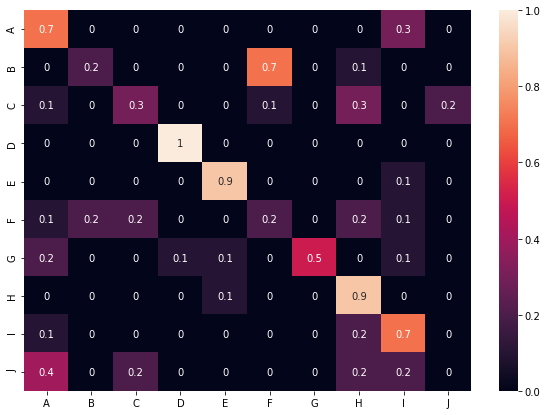

In [20]:
import seaborn as sn
import pandas as pd
import matplotlib.pyplot as plt

cnf_matrix= [[0.7, 0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.3, 0. ],
             [0.,  0.2, 0.,  0.,  0.,  0.7, 0.,  0.1, 0.,  0. ],
             [0.1, 0.,  0.3, 0.,  0.,  0.1, 0.,  0.3, 0.,  0.2],
             [0.,  0.,  0.,  1.,  0.,  0.,  0.,  0.,  0.,  0. ],
             [0.,  0.,  0.,  0.,  0.9, 0.,  0.,  0.,  0.1, 0. ],
             [0.1, 0.2, 0.2, 0.,  0.,  0.2, 0.,  0.2, 0.1, 0. ],
             [0.2, 0.,  0.,  0.1, 0.1, 0.,  0.5, 0.,  0.1, 0. ],
             [0.,  0.,  0.,  0.,  0.1, 0.,  0.,  0.9, 0.,  0. ],
             [0.1, 0.,  0.,  0.,  0.,  0.,  0.,  0.2, 0.7, 0. ],
             [0.4, 0.,  0.2, 0.,  0.,  0.,  0.,  0.2, 0.2, 0. ]]
df_cm = pd.DataFrame(cnf_matrix, index = [i for i in "ABCDEFGHIJ"],
                  columns = [i for i in "ABCDEFGHIJ"])
plt.figure(figsize = (10,7))
sn.heatmap(df_cm, annot=True)

## SVM Model:


In [6]:
import numpy as np

from sklearn import svm
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA

file = np.load('melspectograms.npz')
x_train = file['x_train']
y_train = file['y_train']
x_test = file['x_test']
y_test = file['y_test']
x_cv = file['x_cv']
y_cv = file['y_cv']

x_train = x_train.reshape(x_train.shape[0], x_train.shape[1]*x_train.shape[2])
x_cv = x_cv.reshape(x_cv.shape[0], x_cv.shape[1]*x_cv.shape[2])
x_test = x_test.reshape(x_test.shape[0], x_test.shape[1]*x_test.shape[2])

scaler = StandardScaler()
scaler.fit(x_train)
scaled_train = scaler.transform(x_train)
scaled_cv = scaler.transform(x_cv)
scaled_test = scaler.transform(x_test)

pca = PCA(n_components = 15)
pca.fit(scaled_train)

pca_train = pca.transform(scaled_train)
pca_cv = pca.transform(scaled_cv)
pca_test = pca.transform(scaled_test)

classifier = svm.SVC()
classifier.fit(pca_train, y_train)

train_prediction = classifier.predict(pca_train)
train_accuracy = np.sum(train_prediction == y_train)
train_accuracy = train_accuracy / len(y_train)

cv_prediction = classifier.predict(pca_cv)
cv_accuracy = np.sum(cv_prediction == y_cv)
cv_accuracy = cv_accuracy / len(y_cv)


test_prediction = classifier.predict(pca_test)
test_accuracy = np.sum(test_prediction == y_test)
test_accuracy = test_accuracy / len(y_test)

print('Train: ', train_accuracy, "\tCV: ", cv_accuracy, "\tTest: ", test_accuracy)


c:\users\mayuri\appdata\local\programs\python\python37\lib\site-packages\sklearn\svm\base.py:196: FutureWarning: The default value of gamma will change from 'auto' to 'scale' in version 0.22 to account better for unscaled features. Set gamma explicitly to 'auto' or 'scale' to avoid this warning.
  "avoid this warning.", FutureWarning)


Train:  0.875125 	CV:  0.54 	Test:  0.54


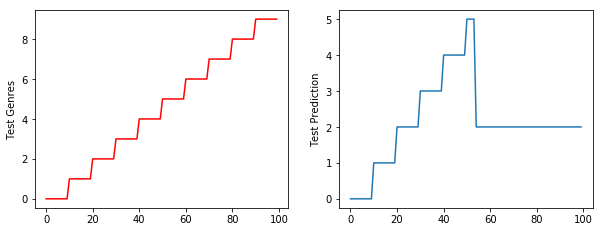

In [7]:
import matplotlib
from matplotlib import pyplot as plt
%matplotlib inline

fig = plt.figure(figsize=(10,8))
ax4 = fig.add_subplot(221)
plt.ylabel("Test Genres")    
plt.plot(y_test, 'r')

ax5 = fig.add_subplot(222)
plt.ylabel("Test Prediction")
plt.plot(test_prediction)

## AutoEncoder Model:

In [7]:
import numpy as np
import tensorflow as tf
import pandas as pd
import math
from random import shuffle
import os
import sox
import librosa


"""
    Inorder to keep the funnel(butterfly) architecture we have taken 500 input 
    features in the beginning and then reducing it slowly to 64 (and increasing back to 500).
    all the hyper-parameters have been chosen using brute force technique and the parameters 
    giving best performances were chosen.
"""
input_dim = 500
examples = 8000
labels = 4
alpha = 0.0001
num_epochs = 200
batch_size = 512
classweight = 0.1
ae_accuracy = 0

def one_hot_encoder(label_index, labels = 10):
    one_hot = np.zeros((1,labels))
    one_hot[0, int(label_index)] = 1
    return one_hot

def load_data():
    
    genres = ['blues', 'classical', 'country', 'disco', 'hiphop', 'jazz', 'metal', 'pop', 'reggae', 'rock']
    audio_features = np.zeros((examples, input_dim))
    one_hot_encodings = np.zeros((examples, labels))
    counter = 0
    """
        In this model we are spliting the audio files in 1 second each:
        so, the number of examples will be numsplit * 1000, since we have 1000 songs
        Inorder to try another way of handling the inputs to the model(unlike using npy(or npzs) 
        we have collected the attribute values of all the audios in a dataframe and used it as an input to our model.)
    """
    
    numsplit = 20
    sizesplit = input_dim
   
    
    for index in range(len(genres)):
        for filename in os.listdir('./genres/' + genres[index]):
            if filename.endswith(".wav"):
                audio, sr = librosa.core.load('./genres/' + genres[index] + '/' + filename)
                # taking mean of values for getting the sampling rate of 500Hz
                audio = audio[:600000]
                audio = audio.reshape(15000, 40)
                audio = np.mean(audio, axis=1)

                for j in range(numsplit):
                    audio_features[counter] = audio[(sizesplit * j) : (sizesplit * (j + 1))]
                    one_hot_encodings[counter] = one_hot_encoder(index)
                    counter += 1
    audio_features = pd.DataFrame(audio_features)
    one_hot_encodings = pd.DataFrame(one_hot_encodings)
    return audio_features, one_hot_encodings

def get_placeholders():
    inputs_placeholder = tf.placeholder(tf.float32, (None, input_dim))
    labels_placeholder = tf.placeholder(tf.float32, (None, labels))
    tf.add_to_collection('inputs_placeholder', inputs_placeholder)
    tf.add_to_collection('labels_placeholder', labels_placeholder)
    keep_prob = tf.placeholder_with_default(1.0, shape=(), name='keep_prob')
    return inputs_placeholder, labels_placeholder, keep_prob

def add_parameters():
    weights = {}
    weights["W1_encoder"] = tf.get_variable(name="W1_encoder", shape = (input_dim, 256), initializer = tf.contrib.layers.xavier_initializer())
    weights["W2_encoder"] = tf.get_variable(name="W2_encoder", shape = (256, 192), initializer = tf.contrib.layers.xavier_initializer())
    weights["W3_encoder"] = tf.get_variable(name="W3_encoder", shape = (192, 128), initializer = tf.contrib.layers.xavier_initializer())
    weights["W4_encoder"] = tf.get_variable(name="W4_encoder", shape = (128, 64), initializer = tf.contrib.layers.xavier_initializer())
    
    weights["W1_decoder"] = tf.get_variable(name="W1_decoder", shape = (64, 128), initializer = tf.contrib.layers.xavier_initializer())
    weights["W2_decoder"] = tf.get_variable(name="W2_decoder", shape = (128, 192), initializer = tf.contrib.layers.xavier_initializer())
    weights["W3_decoder"] = tf.get_variable(name="W3_decoder", shape = (192, 256), initializer = tf.contrib.layers.xavier_initializer())
    weights["W4_decoder"] = tf.get_variable(name="W4_decoder", shape = (256, input_dim), initializer = tf.contrib.layers.xavier_initializer())

    weights["b1_encoder"] = tf.get_variable(name="b1_encoder", initializer = tf.zeros((1,256)))
    weights["b2_encoder"] = tf.get_variable(name="b2_encoder", initializer = tf.zeros((1,192)))
    weights["b3_encoder"] = tf.get_variable(name="b3_encoder", initializer = tf.zeros((1,128)))
    weights["b4_encoder"] = tf.get_variable(name="b4_encoder", initializer = tf.zeros((1,64)))
    
    weights["b1_decoder"] = tf.get_variable(name="b1_decoder", initializer = tf.zeros((1,128)))
    weights["b2_decoder"] = tf.get_variable(name="b2_decoder", initializer = tf.zeros((1,192)))
    weights["b3_decoder"] = tf.get_variable(name="b3_decoder", initializer = tf.zeros((1,256)))
    weights["b4_decoder"] = tf.get_variable(name="b4_decoder", initializer = tf.zeros((1, input_dim)))

    weights["W1_softmax"] = tf.get_variable(name="W1_softmax", shape = (64, 32), initializer = tf.contrib.layers.xavier_initializer())
    weights["b1_softmax"] = tf.get_variable(name="b1_softmax", initializer = tf.zeros((1,32)))
    weights["W2_softmax"] = tf.get_variable(name="W2_softmax", shape = (32, 16), initializer = tf.contrib.layers.xavier_initializer())
    weights["b2_softmax"] = tf.get_variable(name="b2_softmax", initializer = tf.zeros((1,16)))
    weights["W3_softmax"] = tf.get_variable(name="W3_softmax", shape = (16, labels), initializer = tf.contrib.layers.xavier_initializer())
    weights["b3_softmax"] = tf.get_variable(name="b3_softmax", initializer = tf.zeros((1,labels)))
    
    return weights

#constructing encoder for autoencoder
def encoder(inputs_placeholder, weights, keep_prob):
    a_1 = tf.nn.sigmoid(tf.add(tf.matmul(inputs_placeholder, weights["W1_encoder"]),weights["b1_encoder"]))
    a_2 = tf.nn.tanh(tf.add(tf.matmul(a_1, weights["W2_encoder"]),weights["b2_encoder"]))
    a_2 = tf.nn.dropout(a_2, keep_prob)
    a_3 = tf.nn.relu(tf.add(tf.matmul(a_2, weights["W3_encoder"]),weights["b3_encoder"]))
    a_4 = tf.nn.relu(tf.add(tf.matmul(a_3, weights["W4_encoder"]),weights["b4_encoder"]))
    
    return a_4

#constructing decoder for autoencoder
def decoder(inputs_placeholder, weights, keep_prob):
    a_5 = tf.nn.sigmoid(tf.add(tf.matmul(inputs_placeholder, weights["W1_decoder"]),weights["b1_decoder"]))
    a_6 = tf.nn.sigmoid(tf.add(tf.matmul(a_5, weights["W2_decoder"]),weights["b2_decoder"]))
    a_6 = tf.nn.dropout(a_6, keep_prob)
    a_7 = tf.nn.relu(tf.add(tf.matmul(a_6, weights["W3_decoder"]),weights["b3_decoder"]))
    a_8 = tf.nn.relu(tf.add(tf.matmul(a_7, weights["W4_decoder"]),weights["b4_decoder"]))
    
    return a_8


#constructing classifier
def classifier(inputs_placeholder, weights, keep_prob):
    h_1  = tf.nn.tanh(tf.add(tf.matmul(inputs_placeholder, weights["W1_softmax"]), weights["b1_softmax"]))
    h_2  = tf.nn.tanh(tf.add(tf.matmul(h_1, weights["W2_softmax"]), weights["b2_softmax"]))
    h_3 = tf.add(tf.matmul(h_2, weights["W3_softmax"]), weights["b3_softmax"])
    
    return h_3

def get_batches(Y, size=batch_size):
    return [Y[pos:pos + size] for pos in range(0, len(Y), size)]

def train(X, Y, X_dev, Y_dev):
    
    tf.reset_default_graph()
    inputs_placeholder = tf.placeholder(tf.float32, (None, input_dim))
    labels_placeholder = tf.placeholder(tf.float32, (None, labels))
    tf.add_to_collection('inputs_placeholder', inputs_placeholder)
    tf.add_to_collection('labels_placeholder', labels_placeholder)
    keep_prob = tf.placeholder_with_default(1.0, shape=(), name='keep_prob')
    weights = add_parameters()
    encoder_layer= encoder(inputs_placeholder, weights, keep_prob)
    decoder_layer = decoder(encoder_layer, weights, keep_prob)
    tf.add_to_collection("encoder", encoder_layer)
    tf.add_to_collection("decoder", decoder_layer)

    y_hat = classifier(encoder_layer, weights, keep_prob)
    tf.add_to_collection("y_hat", y_hat)

    loss = tf.reduce_mean(tf.pow(decoder_layer - inputs_placeholder, 2)) + tf.reduce_mean((classweight * tf.nn.softmax_cross_entropy_with_logits_v2(labels=tf.stop_gradient(labellabels_placeholder_batch), logits=y_hat)))

    tf.add_to_collection("loss", loss)
    optimizer = tf.train.AdamOptimizer(learning_rate = alpha).minimize(loss)
    init = tf.global_variables_initializer()
    saver = tf.train.Saver(max_to_keep=5)
    with tf.Session() as sess:
        summary_writer = tf.summary.FileWriter('./logs/autoencoder', sess.graph)
        sess.run(init)
        # Shuffling training data
        ind_list=[i for i in range(X.shape[0])]
        shuffle(ind_list)
        X = X.iloc[ind_list]
        Y = Y.iloc[ind_list]

        train_accuracies = []
        dev_accuracies = []
        loss_per_epoch = []
        for iteration in range(num_epochs):
            batches = get_batches(X)
            labels_batches = get_batches(Y)

            cost_list = []
            totalcorrect = 0
            for i in range(len(batches)):
                batch = batches[i]
                batchlabel = labels_batches[i]
                bottleneck, reconstruction, preds, _, curr_loss = sess.run([encoder_layer, decoder_layer, y_hat, optimizer, loss], feed_dict={inputs_placeholder: batch, labels_placeholder: batchlabel, keep_prob : 0.8})
                predictions = tf.math.argmax(preds, axis=1)
                truelabels = tf.math.argmax(batchlabel, axis=1)
                correct_pred = tf.math.equal(predictions, truelabels)
                count_correct = tf.math.count_nonzero(correct_pred)
                totalcorrect += count_correct.eval()

               
            train_accuracy_score = totalcorrect / float(X.shape[0])
            print("Epoch " + str(iteration+1) + ", Train Accuracy: " + str(train_accuracy_score))
            _, preds = sess.run([encoder_layer, y_hat], feed_dict={inputs_placeholder : X_dev, labels_placeholder : Y_dev, keep_prob : 1.0})
            predictions = tf.math.argmax(preds, axis=1)
            truelabels = tf.math.argmax(Y_dev, axis=1)
            correct_pred = tf.math.equal(predictions, truelabels)
            count_correct = tf.math.count_nonzero(correct_pred)
            dev_accuracy_score = count_correct.eval() / float(X_dev.shape[0])
            print("Epoch " + str(iteration+1) + ", Dev Accuracy: " + str(dev_accuracy_score))
            train_accuracies.append(train_accuracy_score)
            dev_accuracies.append(dev_accuracy_score)
            cost = float(sum(cost_list)) / len(cost_list)
            loss_per_epoch.append(cost)
            #saving sessions
            saver.save(sess, './autoencodermodel/weights', global_step = (iteration+1))
            summary = tf.Summary()
            summary.value.add(tag='train_accuracy', simple_value=train_accuracy_score)
            summary.value.add(tag='dev_accuracy', simple_value=dev_accuracy_score)
            summary.value.add(tag='train_smoothed_cost', simple_value=train_smoothed_cost)
            summary_writer.add_summary(summary, iteration+1)
            summary_writer.flush()
    ae_accuracy = dev_accuracy_score

def main():
    audio_df, labels = load_data()

    # Shuffling training data
    indexes=[i for i in range(audio_df.shape[0])]
    shuffle(indexes)
    audio_df = audio_df.iloc[indexes]
    labels = labels.iloc[indexes]

    # We take 6000 exaples for training and 2000 as dev data to test the performance 
    x_train = audio_df.iloc[0:6000]
    x_dev = audio_df.iloc[6000:]
    y_train = labels.iloc[0:6000]
    y_dev = labels.iloc[6000:]

    train(x_train, y_train, x_dev, y_dev)

if __name__== "__main__":
    main()


Reading data...
Data reading done :)
Epoch 1, Train Accuracy: 0.24833333333333332
Epoch 1, Dev Accuracy: 0.2465
Epoch 2, Train Accuracy: 0.251
Epoch 2, Dev Accuracy: 0.254
Epoch 3, Train Accuracy: 0.2608333333333333
Epoch 3, Dev Accuracy: 0.207
Epoch 4, Train Accuracy: 0.24616666666666667
Epoch 4, Dev Accuracy: 0.3205
Epoch 5, Train Accuracy: 0.249
Epoch 5, Dev Accuracy: 0.296
Epoch 6, Train Accuracy: 0.252
Epoch 6, Dev Accuracy: 0.309
Epoch 7, Train Accuracy: 0.25416666666666665
Epoch 7, Dev Accuracy: 0.2765
Epoch 8, Train Accuracy: 0.24983333333333332
Epoch 8, Dev Accuracy: 0.262
Epoch 9, Train Accuracy: 0.2455
Epoch 9, Dev Accuracy: 0.2465
Epoch 10, Train Accuracy: 0.2455
Epoch 10, Dev Accuracy: 0.2565
Epoch 11, Train Accuracy: 0.25116666666666665
Epoch 11, Dev Accuracy: 0.264
Epoch 12, Train Accuracy: 0.25916666666666666
Epoch 12, Dev Accuracy: 0.236
Epoch 13, Train Accuracy: 0.25433333333333336
Epoch 13, Dev Accuracy: 0.251
Epoch 14, Train Accuracy: 0.2555
Epoch 14, Dev Accuracy: 

Epoch 115, Dev Accuracy: 0.602
Epoch 116, Train Accuracy: 0.7083333333333334
Epoch 116, Dev Accuracy: 0.589
Epoch 117, Train Accuracy: 0.7196666666666667
Epoch 117, Dev Accuracy: 0.593
Epoch 118, Train Accuracy: 0.7213333333333334
Epoch 118, Dev Accuracy: 0.5925
Epoch 119, Train Accuracy: 0.7211666666666666
Epoch 119, Dev Accuracy: 0.5965
Epoch 120, Train Accuracy: 0.7266666666666667
Epoch 120, Dev Accuracy: 0.6095
Epoch 121, Train Accuracy: 0.7361666666666666
Epoch 121, Dev Accuracy: 0.612
Epoch 122, Train Accuracy: 0.7338333333333333
Epoch 122, Dev Accuracy: 0.6
Epoch 123, Train Accuracy: 0.7361666666666666
Epoch 123, Dev Accuracy: 0.61
Epoch 124, Train Accuracy: 0.7343333333333333
Epoch 124, Dev Accuracy: 0.6185
Epoch 125, Train Accuracy: 0.7376666666666667
Epoch 125, Dev Accuracy: 0.609
Epoch 126, Train Accuracy: 0.7391666666666666
Epoch 126, Dev Accuracy: 0.609
Epoch 127, Train Accuracy: 0.7348333333333333
Epoch 127, Dev Accuracy: 0.6055
Epoch 128, Train Accuracy: 0.74183333333333

Epoch 228, Train Accuracy: 0.8643333333333333
Epoch 228, Dev Accuracy: 0.6325
Epoch 229, Train Accuracy: 0.8618333333333333
Epoch 229, Dev Accuracy: 0.63
Epoch 230, Train Accuracy: 0.8651666666666666
Epoch 230, Dev Accuracy: 0.633
Epoch 231, Train Accuracy: 0.8636666666666667
Epoch 231, Dev Accuracy: 0.6325
Epoch 232, Train Accuracy: 0.8653333333333333
Epoch 232, Dev Accuracy: 0.63
Epoch 233, Train Accuracy: 0.8596666666666667
Epoch 233, Dev Accuracy: 0.6275
Epoch 234, Train Accuracy: 0.8696666666666667
Epoch 234, Dev Accuracy: 0.639
Epoch 235, Train Accuracy: 0.8683333333333333
Epoch 235, Dev Accuracy: 0.635
Epoch 236, Train Accuracy: 0.8696666666666667
Epoch 236, Dev Accuracy: 0.6385
Epoch 237, Train Accuracy: 0.8731666666666666
Epoch 237, Dev Accuracy: 0.636
Epoch 238, Train Accuracy: 0.8686666666666667
Epoch 238, Dev Accuracy: 0.6285
Epoch 239, Train Accuracy: 0.8708333333333333
Epoch 239, Dev Accuracy: 0.631
Epoch 240, Train Accuracy: 0.8715
Epoch 240, Dev Accuracy: 0.6245
Epoch 2

Epoch 340, Train Accuracy: 0.9163333333333333
Epoch 340, Dev Accuracy: 0.629
Epoch 341, Train Accuracy: 0.9158333333333334
Epoch 341, Dev Accuracy: 0.6285
Epoch 342, Train Accuracy: 0.9176666666666666
Epoch 342, Dev Accuracy: 0.6285
Epoch 343, Train Accuracy: 0.9155
Epoch 343, Dev Accuracy: 0.6265
Epoch 344, Train Accuracy: 0.9168333333333333
Epoch 344, Dev Accuracy: 0.626
Epoch 345, Train Accuracy: 0.9113333333333333
Epoch 345, Dev Accuracy: 0.623
Epoch 346, Train Accuracy: 0.9005
Epoch 346, Dev Accuracy: 0.6185
Epoch 347, Train Accuracy: 0.9113333333333333
Epoch 347, Dev Accuracy: 0.6305
Epoch 348, Train Accuracy: 0.9121666666666667
Epoch 348, Dev Accuracy: 0.6215
Epoch 349, Train Accuracy: 0.9048333333333334
Epoch 349, Dev Accuracy: 0.63
Epoch 350, Train Accuracy: 0.911
Epoch 350, Dev Accuracy: 0.6325
Epoch 351, Train Accuracy: 0.914
Epoch 351, Dev Accuracy: 0.6255
Epoch 352, Train Accuracy: 0.9131666666666667
Epoch 352, Dev Accuracy: 0.6245
Epoch 353, Train Accuracy: 0.914666666666

## Evaluating Model's Performances:

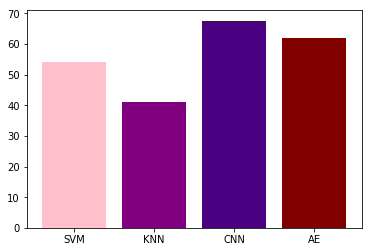

In [96]:
import numpy as np
import matplotlib.pyplot as plt

"""
Accuracies :
    SVM: test_accuracy
    KNN: acc
    CNN: 
    AE: 
"""
height = [test_accuracy, acc, cnn_accuracy, ae]
bars = ('SVM', 'KNN', 'CNN', 'AE')
y_pos = np.arange(len(bars))

plt.bar(y_pos, height, color=('pink', 'purple', 'indigo', 'maroon'))
plt.xticks(y_pos, bars)
plt.show()